<a href="https://colab.research.google.com/github/scottie1013/Copy_of_HW3.ipynb/blob/main/Copy_of_HW3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 3 (A big one)
# Lin. Alg. for Data Science. 
# Due date: hopefully a reasonable one, see discord

# Collaboration rules:
> For this task, you can discuss the problems and solutions -- but you must work on the code on your own. So sharing a notebook with (partial) solutions is not allowed!

> However, feel free to ask for help **publically on discord** if you run into problems with python, numpy, matplotlib, sklearn or some other technicalities. Try to ask general questions, so that you don't spoil the assignment to others. **So don't just copy-paste your code as a question or to answer.**

# Instructions:
0. Solve the tasks (by writing python code and answering extra questions). 
1. Prefix the name of the notebook with your name (e.g. Minecraft_Steve_HW3.ipynb)
2. Run all the cells in the notebook, so that all results are visible.

3. > Important: on colab create a shared link using the option **"for anyone with the link"** and switch permission from **Viewer** to **Editor**, so that it says "Anyone on the internet with the link can edit".

4. Submit the above link on canvas before the deadline. Do not modify the notebook after that.

5. The day after the final deadline, **you will be required to answer** some brief questions about your solution via a google form I will send you. This is part of the homework assignment! 

> This time I will also ask you to copy-paste some of your answers from this notebook to the form.



### Shihao Wang

# Instruction details
- Feel free to discuss the python-specific details on discord or elsewhere
- **You are encouraged to** use the code from our previous notebooks (but do make an effort to understand what is does, don't just copy-paste blindly). In particular, copy-pasting code which does not make sense (e.g. doesn't do anything) could lower your grade slightly.
- Tasks (**marked T:**) require you to do some coding (usually in the code cell directly below).
- Questions (**marked Q:**) are an important part of the homework and meant to make sure you understand what the code you're writing (or copy-pasting...) does, and why you do the things you do. The answers should be written in your own words. The answers should be brief -- but should still convey your understanding. 

Important: Format your answers using  '>' in a text cell like this:
> My brief but insightful answer. Do not use comments for your answers! You can still comment technicalities in the code.


# Overview

The idea is to explore and overview a more realistic image dataset, named cifar100. It has 60_000 colorful images so looking at each of them is not a good idea. Instead we will use tSNE and kMeans and also look at nearest neighbours (in the Euclidean metric). 

Before, we played mostly with MNIST. It shows real data, but it is a heavily-preprocessed, idealized dataset. Now our goals are to:
- See how these methods fare when applied to more realistic images. 
- Observe what patterns are picked up in the images, and understand why that happens.
- Try to understand limitations of using the Euclidean distance to capture the dissimilarity between images  (so don't expect spectacular results!)

Mathematically, we will mostly work with (high-dimensional) vectors, norms, distances, sums, means.

There will be 3 main parts:
- Loading data, checking format etc.
- Exploratory data analysis with tSNE
- Clustering with kMeans (informed by the above part)

And an extra part where you can upload you image and see similar images.

# Evaluation criteria:
- Doing what you're asked to (in a reasonable way) in the tasks
- Briefly answering the questions 

- It's a large assignment, so I won't nitpick about:
  - unreadable code
  - efficient code (if you do something slow, you'll pay with your time...)
  - comments

> I'd still encourage you to define functions for some of the operations you will repeat often, e.g. finding nearest neighbours.


# Imports

T: Import the things you need -- and nothing else!

> Hopefully this will make sure that you didn't just copy-paste all the imports from all my previous notebooks.

In [ ]:
from keras.datasets import cifar100 # this will get you the data!

In [ ]:
# add all other needed imports
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE 
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
plt.rcParams["figure.figsize"] = (15,15)
from ipywidgets import *
import ipywidgets as widgets
from sklearn.cluster import KMeans

# The data [weight 0.2]

> Cifar 100 is another classical image datasets. We have experience with using mnist, and the format will be quite similar.

## Load the data, like we did with mnist. 

Recall that mnist.load_data() returned two pairs: 
(train_images, train_labels), (test_images, test_labels).
 We will mostly use train_images, and train_labels at one occasion. It works similarly for the cifar100 dataset imported above.

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar100.load_data() 

169001437/169001437 [==============================] - 4s 0us/step


> hint: To avoid problems later, ensure they are float values between 0 and 1. # (modify the images if necessary).

In [ ]:
print(x_train.shape)
print(y_train.shape)

(50000, 32, 32, 3)
(50000, 1)


In [ ]:
x_train.max(axis = (1,2))

array([[255, 255, 255],
       [255, 255, 255],
       [252, 252, 248],
       ...,
       [248, 244, 242],
       [186, 184, 163],
       [219, 255, 248]], dtype=uint8)

In [ ]:
x_train = x_train / 255. 

> Plot the image with the index defined below. Hint: use plt.imshow and not plt.plot!

(32, 32, 3)


/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


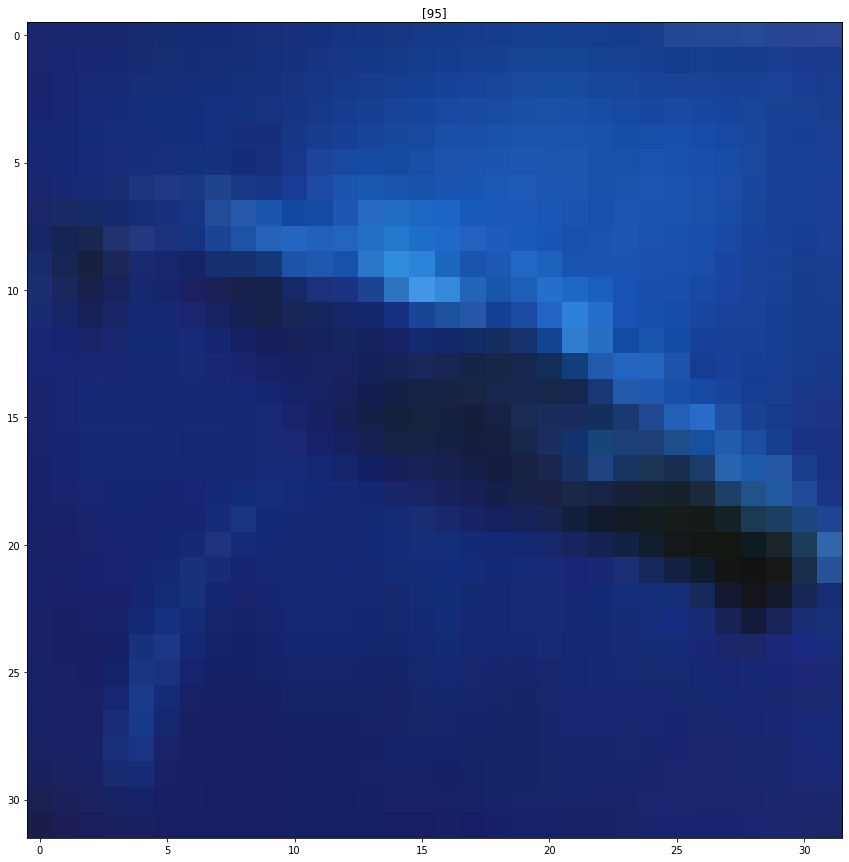

In [ ]:
ind = 4311
print(x_train[ind].shape)
plt.imshow(x_train[ind]); 
label = y_train[ind]
#print(label)
plt.title(label);

## Channels of an RGB image
An image has 3 channels corresponding to R,G,B.

T: Plot each channel (of the image you plotted) separately using plt.imshow Now look at the 3 plots. Which channel (R,G,B) contributes the most (has highest intensity values)?

Q: Is it consistent with your expectation?

> This is consistent with my expectation since the original image is mainly blue of blue color, and the intensity value shows that blue contributes the most among RGB

intensity value 0.09361213235294118


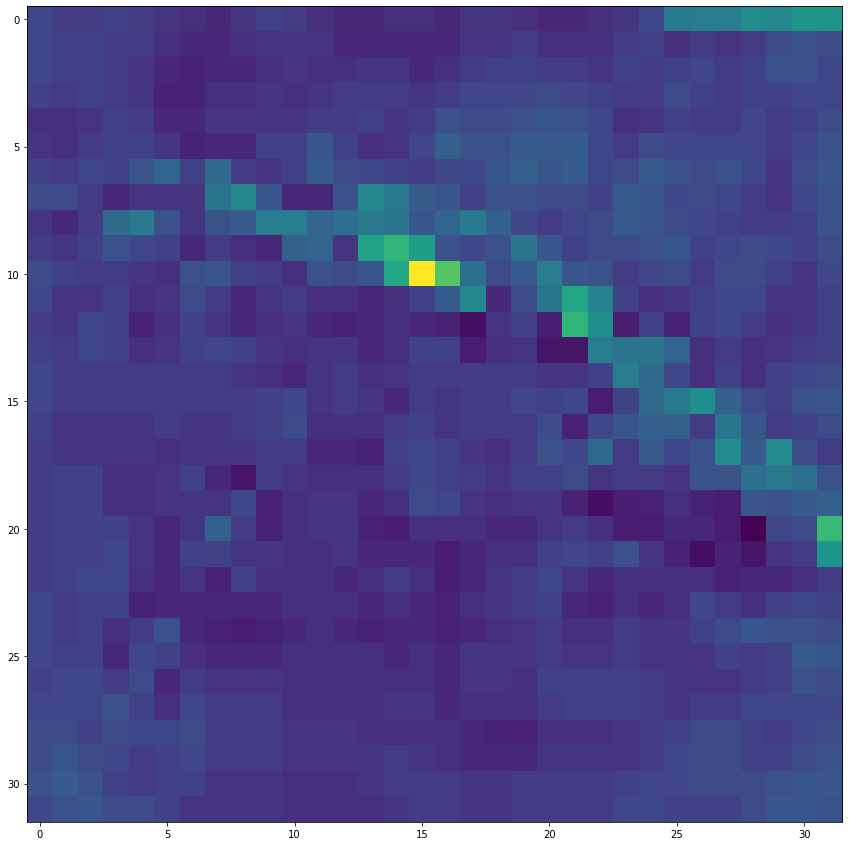

intensity value 0.1974609375


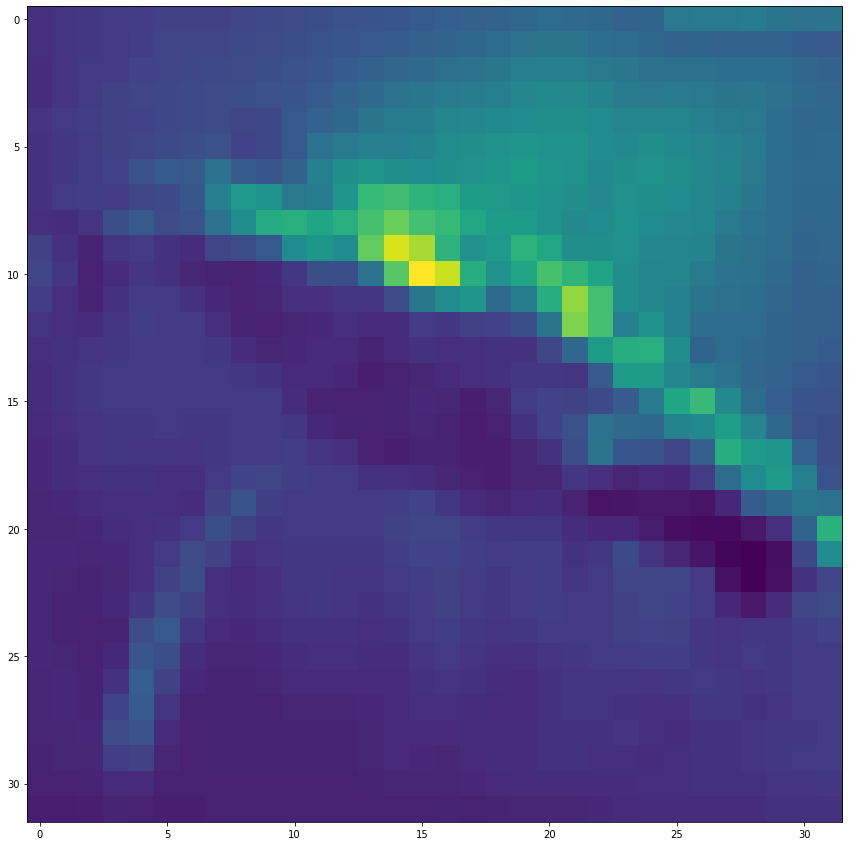

intensity value 0.4806832107843137


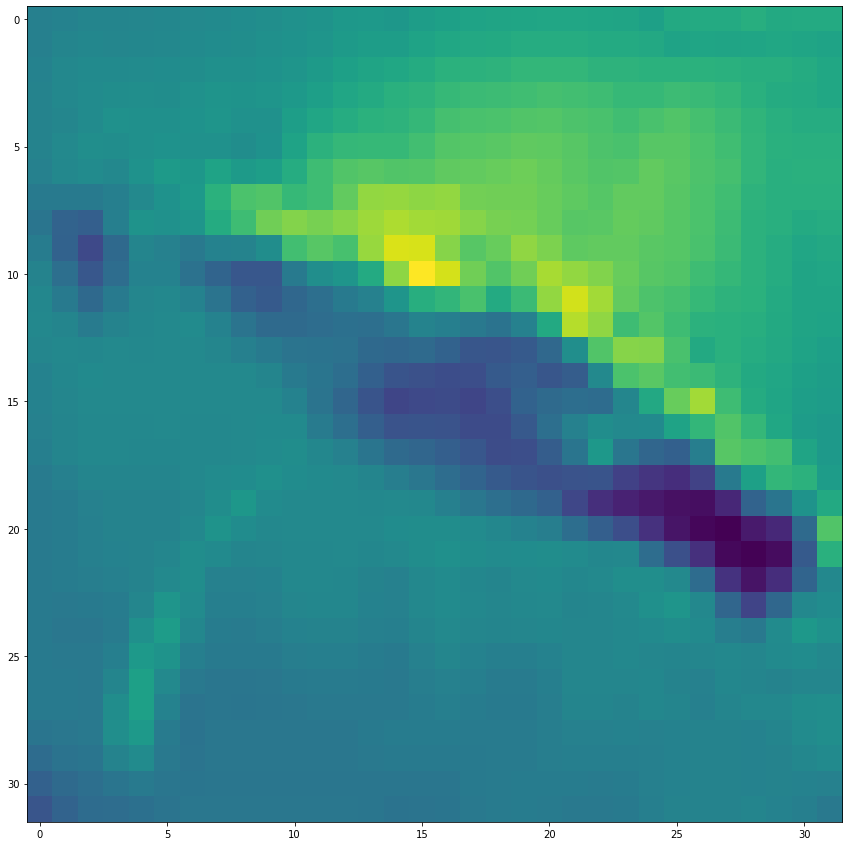

In [ ]:
for i in range(3): # it's okay here...
  pass # this just makes sure you can run this cell as is -- remove it later
  img = x_train[ind][:, :, i]
  mean = np.mean(x_train[ind][:, :, i])
  print('intensity value', mean)
  plt.imshow(img)
  plt.show() # remember to force each image to be plotted

## Closest images

Recall that we can think about an image as a vector in a high-dimensional vector space, $\mathbb{R}^d$.


T: Compute and plot a bunch of images closest (in the sense of the Euclidean distance) to the above image. For clarity, plot the images in a horizontal row.

> Tip: remember about np.argsort -- it's very useful whenever we talk about finding k nearest vectors.

> As a gesture of good faith, below is a helpful function I wrote *especially* for you!



In [ ]:
def plot_images_in_a_row(ims):    
  'Takes a list/array of images and plots them spaced horizontally.'
  _, axs = plt.subplots(1, len(ims), figsize = (20,5))
  for im, ax in zip(ims, axs.ravel()):
    ax.imshow(im)
    ax.axis('off')

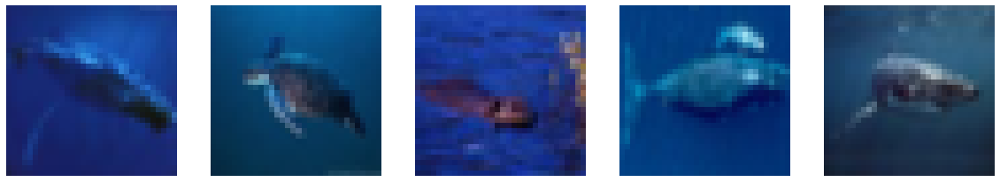

In [ ]:
# your code
N_IMAGES = x_train.shape[0]
FLAT_VECTOR_SIZE = 32*32*3

x_train_flat = x_train.reshape((N_IMAGES, FLAT_VECTOR_SIZE))

query_vector_index = ind
query_vector = x_train_flat[query_vector_index]

distances = np.linalg.norm(x_train_flat - query_vector, axis = 1)
assert distances[query_vector_index] == 0 
# use np.argsort 
sorted_indices = distances.argsort()
k = 5
indices_of_nearest = sorted_indices[:k]
nearest_images = x_train_flat[indices_of_nearest].reshape((k, 32,32,3))
nearest_dists = distances[indices_of_nearest]

plot_images_in_a_row(nearest_images)

# Exploring the data with t-SNE [weight 0.4]


T: Set up tSNE with appropriate parameters.

T: Make sure there are *no warnings* printed (you may need to set some additional parameters).

Q: Note down how you came up with the values of the parameters -- I will ask you for them later.


> I increased the number of iterations by 100 starting from 100 each time and perplexity by 10 starting from 50 till I get a tsne plot that is reasonably distributed(not too scattered nor too dense) 

In [ ]:
NUM_VECTORS = 7000 # PARAM
num_iters = 600 # PARAM 
perplexity = 100 # PARAM 
x_train1 = x_train[:NUM_VECTORS]
y_train1 = y_train[:NUM_VECTORS]
my_random = 1000 # PARAM
my_learning_rate = 10 # PARAM

## Init TSNE
tsne = TSNE(n_components = 2, n_iter = num_iters, 
               perplexity = perplexity, random_state = my_random, learning_rate = my_learning_rate, init = 'pca') 

In [ ]:
tsne.fit(x_train1.reshape((NUM_VECTORS, 32*32*3)))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


TSNE(init='pca', learning_rate=10, n_iter=600, perplexity=100,
     random_state=1000)

In [ ]:
# get the new 'embeddings'
x_reduced = tsne.embedding_

In [ ]:
# make an assert checking the shape of resulting array
assert x_reduced.shape == (NUM_VECTORS, 2)

T: Fit the model with your data and retreive the result. (Remember that tSNE doesn't know -- or care -- about 2D images)

> Hint: You may need to limit the amount of data, since tSNE tends to be slow.

## Plotting t-SNE embedding



T: Scatter-plot the output of tSNE. 

Q: Can you see significant structure? Maybe some groups?

> I can see a structure and there are couple groups that are pretty close to each other

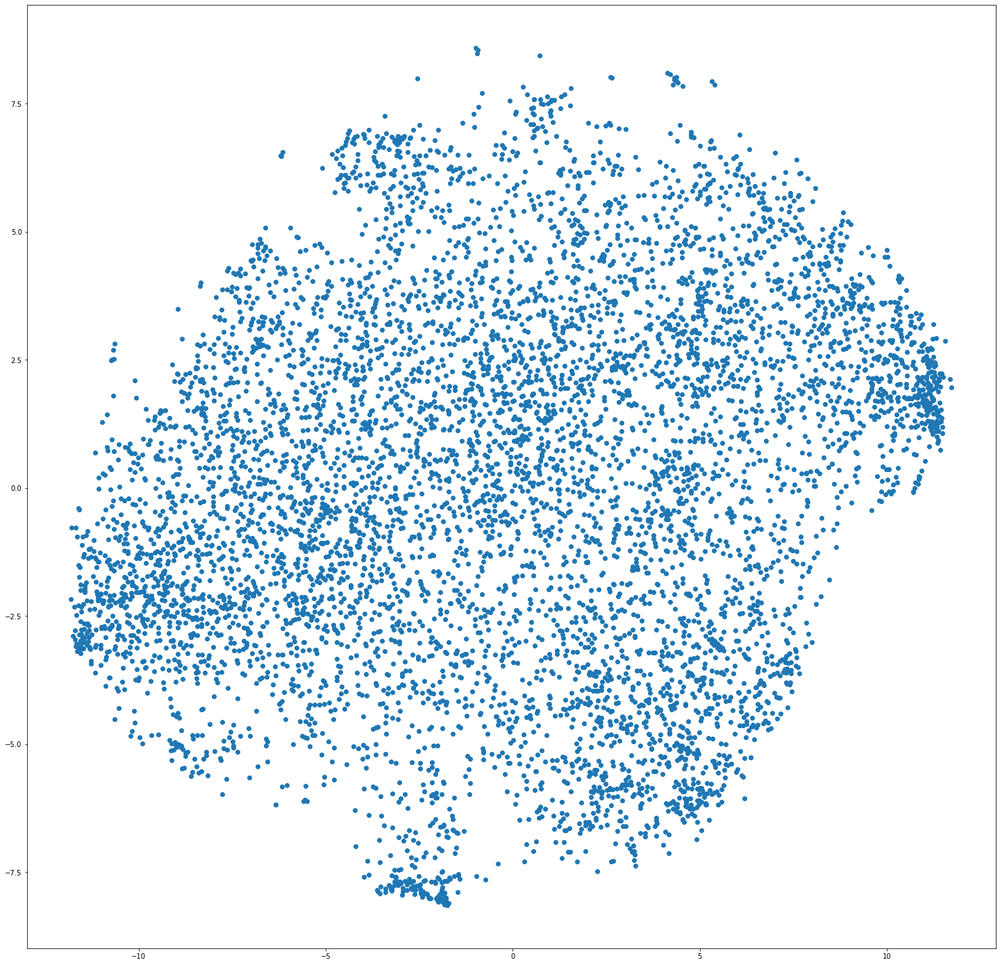

In [ ]:
np.random.seed(0)
plt.figure(figsize = (25,25)) 

label_colors = np.random.random((10, 3))

#colors = label_colors[y_train]

plt.scatter(x_reduced.T[0], x_reduced.T[1])

T: Now scatter-plot the output but assigning a color (can be random)
depending on the label (it's part of the data!). So images with the same label get the same color.

Q: How well does the structure reflect the labels?

> structure is decently reflected by the labels, there are several groups having similar colors

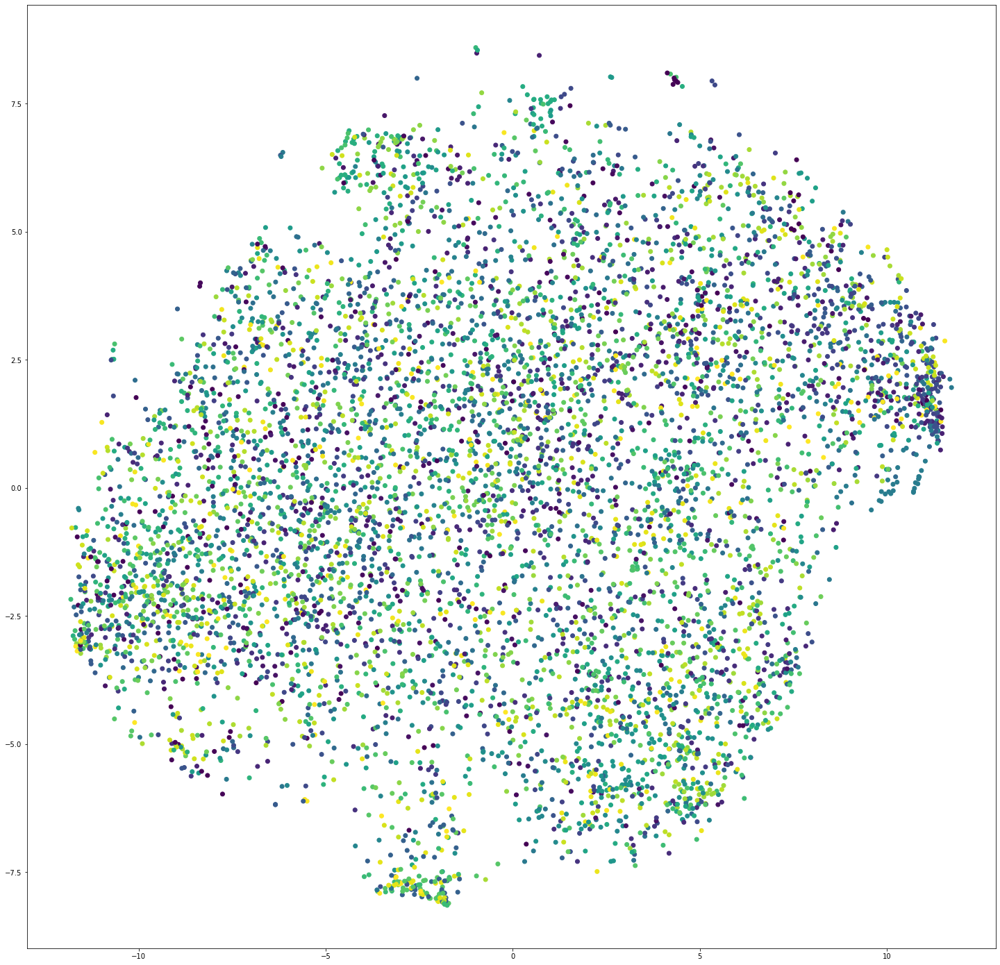

In [ ]:
np.random.seed(0) # to fix the random colors
plt.figure(figsize = (25,25)) 

#label_colors = np.random.random((10,4))

plt.scatter(x_reduced.T[0], x_reduced.T[1], c = y_train[:7000])

## Plotting the images in t-SNE embedding space

T: Using the above function, plot the tsne output again -- 
but plot the original images at locations given by tsne  (as we did with mnist during class!).

Q: Can you see significant structures now? Any groups of similar images?
In what sense are they 'similar'?

> (Tip: if the generated plot is large, you can click on it and zoom. You can also save the ouput, download the resulting image on your computer
And zoom it more comfortably.)

> yes, there are groups having the same pattern, colors, shape, category etc

In [ ]:
x_reduced.shape

(7000, 2)

In [ ]:
def plot_image_at_point(im, xy, zoom = 1):    
  dxy = np.random.rand(2)/100 * plt.ylim()
  plt.arrow(*xy, *dxy)
  ab = AnnotationBbox(OffsetImage(im, zoom=zoom, cmap = 'gray_r'), xy + dxy, frameon=False)
  plt.gca().add_artist(ab)

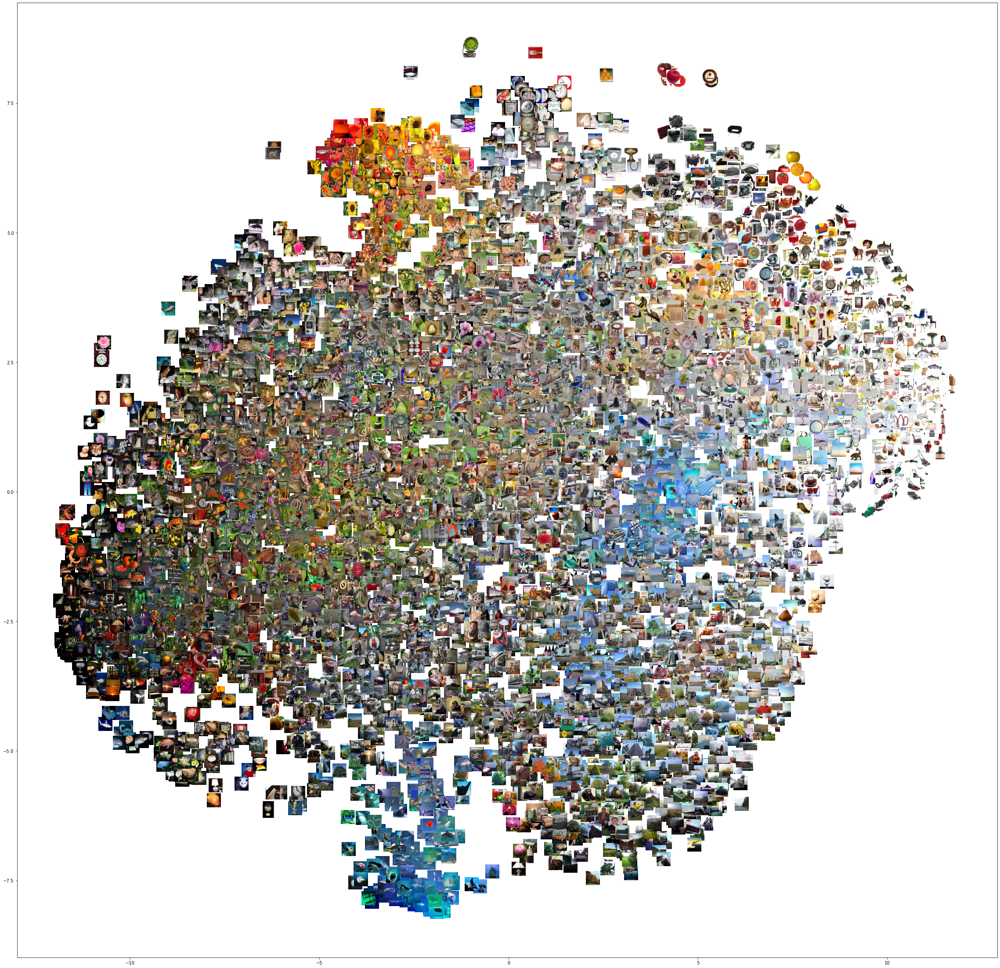

In [ ]:
# hint: make sure you scatter-plot the points as above, or the images may 
# not show up!

np.random.seed(0)
plt.figure(figsize = (40,40)) 

plt.scatter(x_reduced.T[0], x_reduced.T[1])

image_zoom = 1.0 # controls the size of plotted inmages

for im, xy in zip(x_train1, x_reduced):
  plot_image_at_point(im, xy, image_zoom)

## Patterns inside groups of images

> There should be groups of 'similar' images, according to some visible **pattern**.

> For example: apparently there is a bunch of images with an object in a center on a white background; another one with sky in the upper part and something else in the lower part. So these would be two patterns.

Q: Why would tSNE group images exhibiting the same pattern?

Q: What other patterns that tSNE picked up on can you distinguish? Is it only about color? Maybe some other features of an image get picked up?

T: Find at least 5 new **patterns**, describe them briefly

Q: Elaborate why you think these patterns occur.

> they are close to each other in the higher dimension space and therefore sharing similar features.

other than color, shape, how it is distributed in the graph etc

> images with trees togther

> images with parts sticking out groups together(lawn mowers, bug legs, dinasour with long legs), 

> images with round shapes together, 

> images with red color object with white background together, 

> images associated with aquactic animals grouped together

> these patterns occur because some varibales has similar value to each other in these grouped images, they might have similar color, shape, distribution etc

> For each of the 5 types of **patterns**,
you identified before, we can select their 
representative imagees using their tSNE coordinates.

> For example: in my case "the things on a white background",
had tSNE coordinates close to $(-15,-15)$, so I found 10 images with tSNE 
coordinates closest to $(-15,-15)$. I then plotted them in one row.

T: Do the above for your five selected types of **patterns**.

Q: Did you get the expected images (namely the ones which you could see 
on the tSNE plot with images)?

> Yes I get the expected images

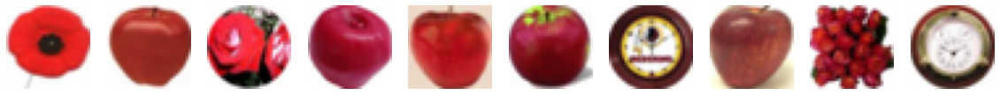

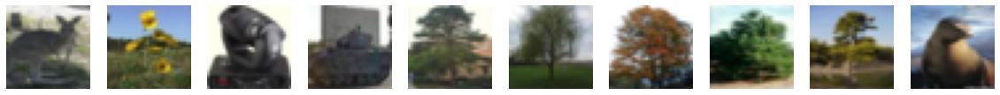

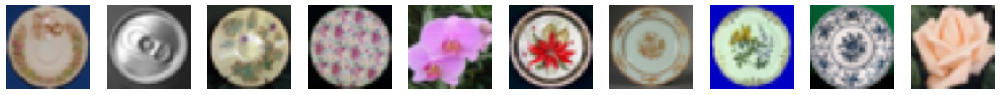

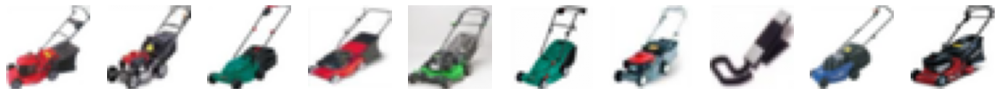

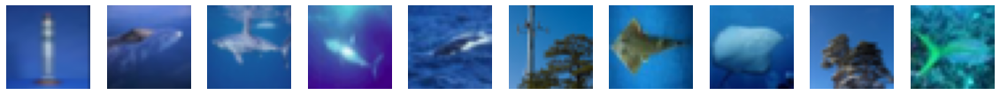

In [ ]:
# your code

N_IMAGE = x_reduced.shape[0]

pattern = [[4.8,8],[2.7,-6],[0.5,7.5],[10,0],[-2.5,-7.5]]
for i in range(5):
  x_train_flat = x_reduced.reshape((N_IMAGE, 2))
  query_vector = pattern[i]
  distances = np.linalg.norm(x_train_flat - query_vector, axis = 1)
  # use np.argsort 
  sorted_indices = distances.argsort()
  k = 10
  indices_of_nearest = sorted_indices[:k]
  plot_images_in_a_row(x_train1[indices_of_nearest])

> Let's try a similar thing in the original, high-dimensional space.

T: Pick a representative image for each of the 5 **patterns**, and find 10 images which are closest *in the original high-dimensional space*. Plot them.

Q: Are the results the same as previously? **This is really important: elaborate!**

> the results are similar but nor completely same. by using tsne and reduce the dimension of the data, we preservered some level of similarity yet not all of the information are retained, therefore they are similar but not comepletely same 

In [ ]:
#find the indices of each image for each pattern
N_IMAGE = x_reduced.shape[0]

pattern = [[4.8,8],[2.7,-6],[0.5,7.5],[10,0],[-2.5,-7.5]]
for i in range(5):
  lists = []
  x_train_flat = x_reduced.reshape((N_IMAGE, 2))
  query_vector = pattern[i]
  distances = np.linalg.norm(x_train_flat - query_vector, axis = 1)
  # use np.argsort 
  sorted_indices = distances.argsort()
  k = 10
  indices_of_nearest = sorted_indices[:k]
  print(indices_of_nearest)


[4154 3708  126 5792 4767 3057 6027  658 5031 3975]
[4696 1919 3457 4635 4936 2951   56 4708 2834 6808]
[2524 6965 6008 6043 6276 4220 6911 3914  807 1580]
[6654 5388 3589 1256 1408 2475 1152 3795  998 4108]
[2152 5648 6651 1082 2899  731 2860 5807 1562  595]


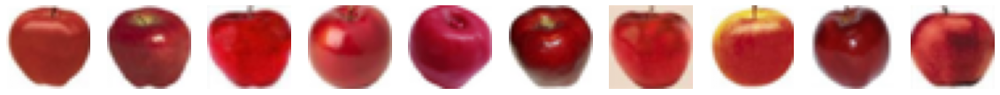

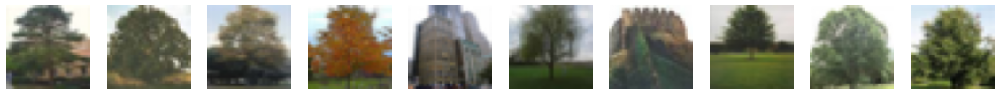

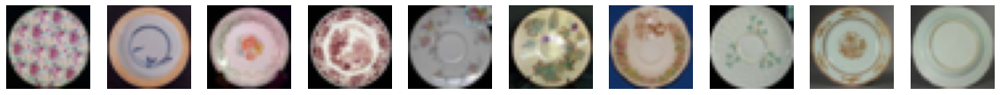

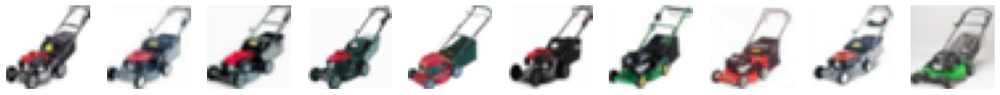

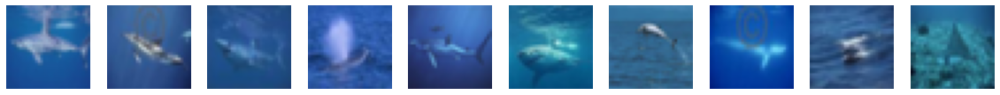

In [ ]:
N_IMAGE = x_train.shape[0]
#pick five representative images for each pattern
representative_index = [3708, 4936, 6043, 5388, 6651]
x_train_flat = x_train.reshape((N_IMAGE, 32*32*3))

for i in representative_index:
  query_vector = x_train_flat[i]
  distances = np.linalg.norm(x_train_flat - query_vector, axis = 1)
  # use np.argsort 
  sorted_indices = distances.argsort()
  k = 10
  indices_of_nearest = sorted_indices[:k]
  plot_images_in_a_row(x_train[indices_of_nearest])

# Clustering with k-Means [weight 0.4]

> We can use the information obtained from the 'exploratory data analysis' done in the previous part. In particular, it should give us a hint about a reasonable number of clusters to use.

Hint: we want to work with the original dataset -- not with the output of tSNE! tSNE is great but we don't trust it so much.



Q: Based on the last part, how many clusters do you think is good for kMeans? Why?

T: Set up KMeans with some rasonable $k$ based on the previous part (no worries: there is no single best answer).

> Tip: to speed things up you import and use **MiniBatchKMeans** instead of KMeans. 
> It's less accurate, faster, good enough here, and you use it the same way. You don't have to use it -- but not using it will cost you more time and you will lose some credit. So just use it.

> 20, we can see around 20 groups with the same pattern in the previous data analysis 

In [ ]:
from sklearn.cluster import MiniBatchKMeans

In [ ]:
# initialize kmeans
kmeans = MiniBatchKMeans(n_clusters=20)# initialize the model

T: Fit kMeans with your data.

In [ ]:
t = x_train.reshape((x_train.shape[0], 32*32*3))

In [ ]:
# fit 7000 points
#kmeans.fit(x_train.reshape((x_train.shape[0], 32*32*3))) # fit with data
kmeans.fit(t[:7000]) # fit with data

MiniBatchKMeans(n_clusters=20)

## Plot tSNE embedding using clusters' labels

> Let's see to what extent the kMeans clusters 
resemble the structure of the tSNE output. 

T: Plot the tSNE embedding again -- but this time assign
colors corresponding to KMeans cluster of each image.

Q: Can you see significant groups of points with the same color (label)? (If not, something is wrong.) How many do you see, roughly? 

> roughly 20 clusters with the same color

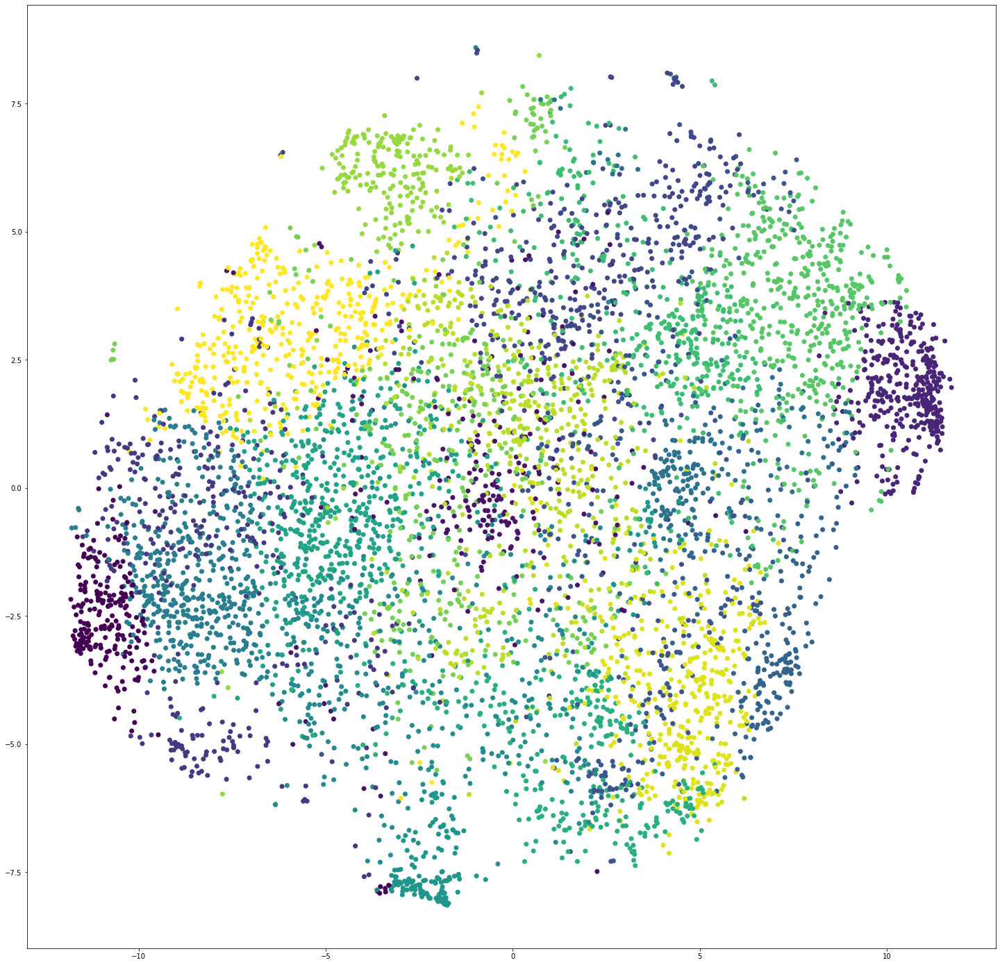

In [ ]:
np.random.seed(0) # to fix the random colors
plt.figure(figsize = (25,25)) 

#label_colors = np.random.random((10,4))

plt.scatter(x_reduced.T[0], x_reduced.T[1], c = kmeans.labels_)

T: Repeat the plot above but define the color of each point as the mean color of 
the images in the cluster to which image belongs to.

> Hint: You should see some blue and orange parts. Also some almost white and quite dark parts? If yes -- good.

> If you don't see them -- something is likely wrong. Maybe too few iterations? If everything is gray, something is very  wrong -- maybe way too few clusters (k). Tune the parameters until happy. Do you see why we wanted to use the faster, approximate version of k-means? Data analysis is often done iteratively/interactively -- so efficient algorithms save your time.

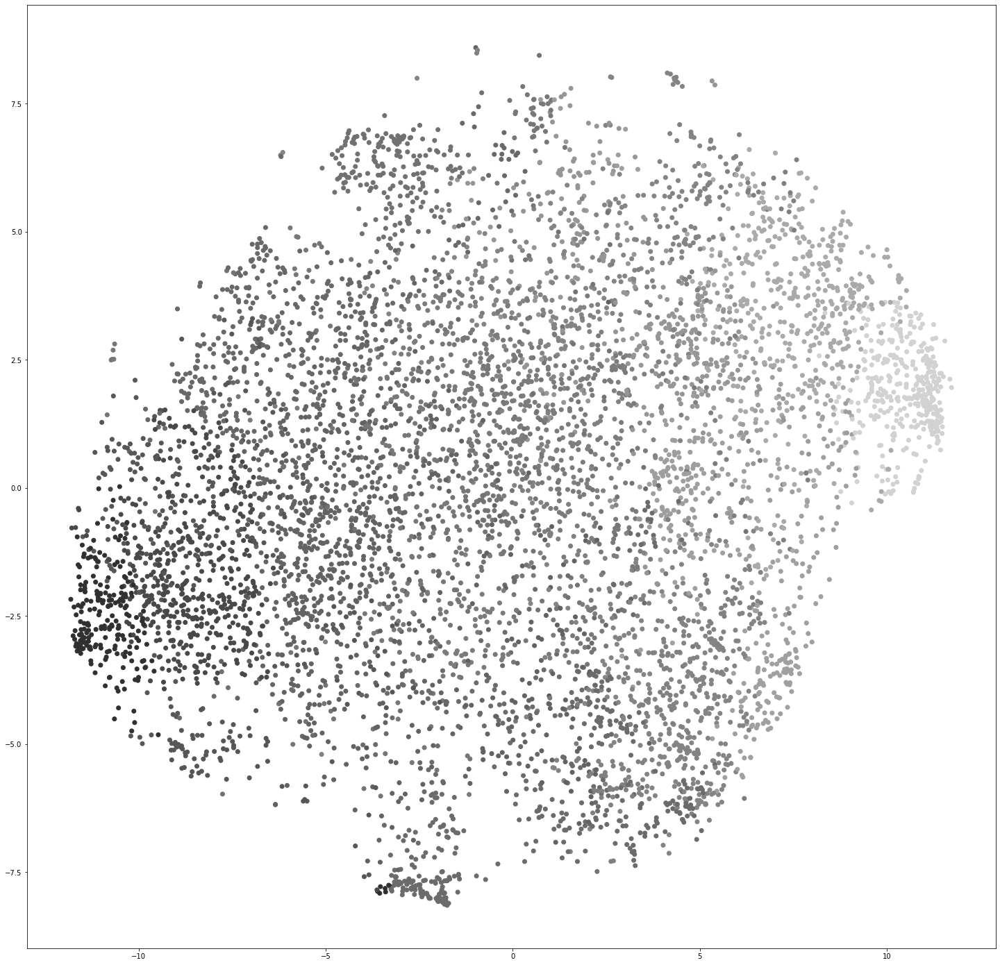

In [ ]:
colors = np.empty([7000, 3])

for i in range(20):
  cluster_index = np.where(kmeans.labels_ == i)
  image_in_cluster = x_train_flat[cluster_index]
  colors_for_clusters = np.mean(image_in_cluster,axis=(0,1))
  colors[cluster_index] = colors_for_clusters
np.random.seed(0) # to fix the random colors
plt.figure(figsize = (25,25)) 
plt.scatter(x_reduced.T[0], x_reduced.T[1], c = colors)

## kMeans on the entire dataset

> If you're not satisfied with the quality you can tune the parameters some more.

T: If everything looks acceptable, rerun 
kMeans on the full dataset -- something which we couldn't realistically do
with tSNE!

In [ ]:
kmeans.cluster_centers_.shape

(20, 3072)

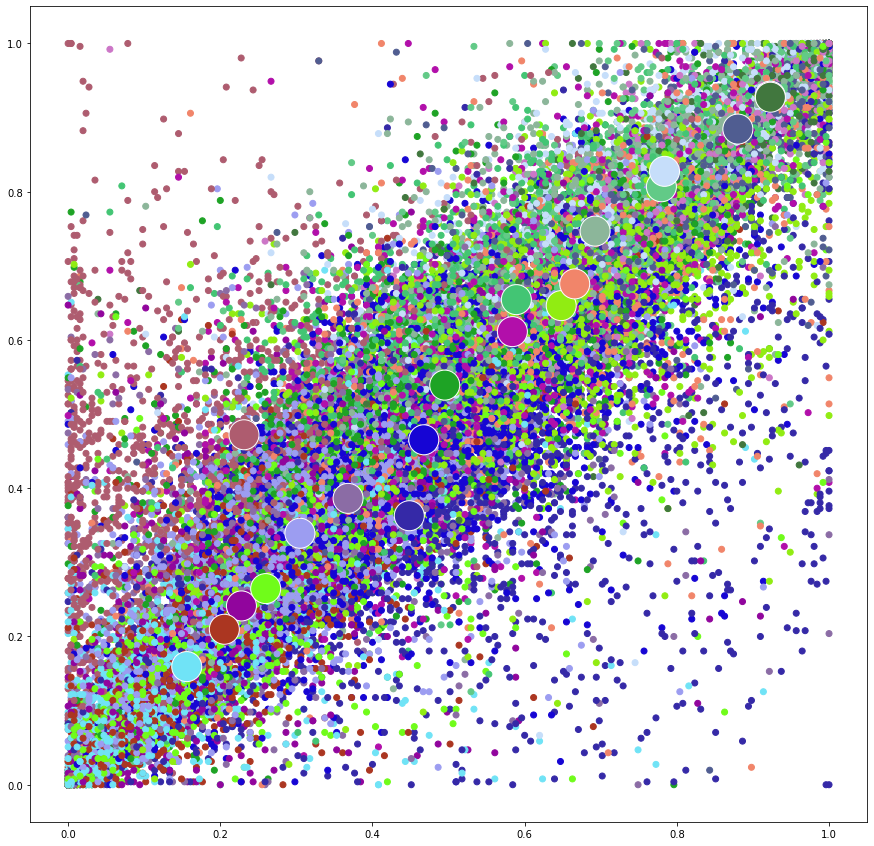

In [ ]:

cluster_colors = np.random.rand(20, 3)

kmeans = MiniBatchKMeans(n_clusters=20)
# fit it
kmeans.fit(x_train.reshape((x_train.shape[0], 32*32*3))) # fit with data


indices_of_nearest_centers = kmeans.labels_

# indexing with an array of indices
good_point_colors = cluster_colors[indices_of_nearest_centers] 

plt.scatter(x_train.reshape((x_train.shape[0], 32*32*3)).T[0], x_train.reshape((x_train.shape[0], 32*32*3)).T[1], c = good_point_colors)
CS = kmeans.cluster_centers_
plt.scatter(CS.T[0], CS.T[1], c = cluster_colors, edgecolor = 'white', s = 900);

> Let's veriify if the clusters we got on the entire dataset are reasonable.

T: For each cluster center, plot, say, 10 images which are closest in the sense of the Euclidean metric to it.

Q: Did you see anything suspicious? For example: if any cluster center look like a single image in the dataset, you likely chose too many clusters!

> nothing really stands out as suspicious, although some pictures does not look similar with each other

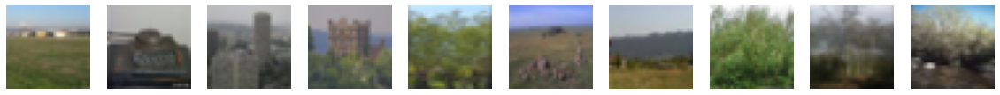

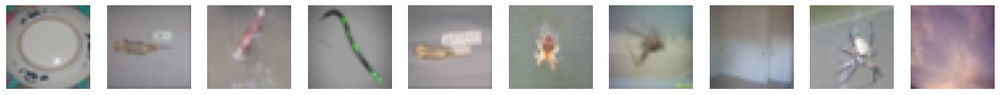

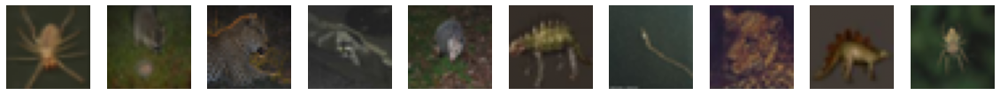

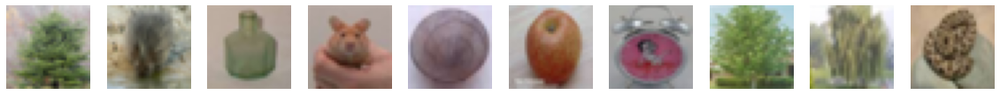

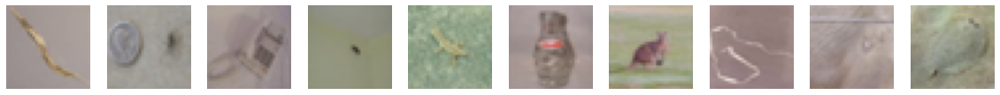

...

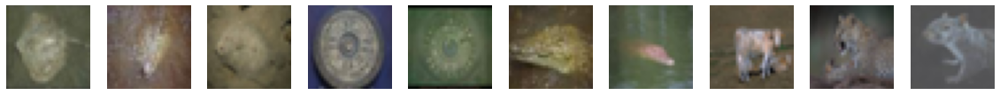

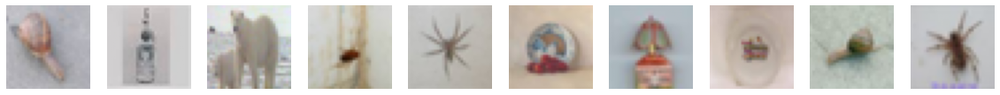

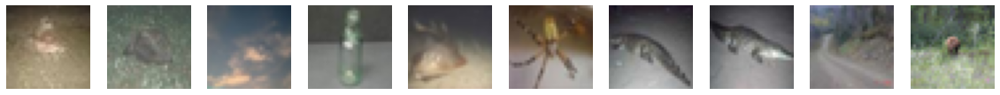

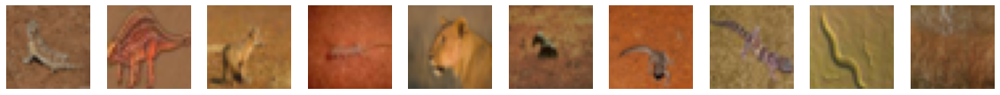

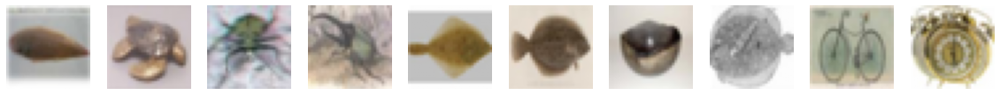

In [ ]:
# your code

N_IMAGES = x_train.shape[0]
FLAT_VECTOR_SIZE = 32*32*3

x_train_flat = x_train.reshape((N_IMAGES, FLAT_VECTOR_SIZE))
for i in range (20):

  query_vector = CS[i]

  distances = np.linalg.norm(x_train_flat - query_vector, axis = 1)
  # use np.argsort 
  sorted_indices = distances.argsort()
  k = 10
  indices_of_nearest = sorted_indices[:k]
  nearest_images = x_train_flat[indices_of_nearest].reshape((k, 32,32,3))
  nearest_dists = distances[indices_of_nearest]

  plot_images_in_a_row(nearest_images)

# Bonus [some extra credit]: 

try your own image! Does it belong to a cluster you'd expect? 

In [ ]:
# Another helper function
from google.colab import files
from PIL import Image

def get_uploaded_image(size = (32,32)):
  '''Lets you download and image.
  Returns an np.array representing the downloaded image.
  The image is resized to the provided size.
  '''
  filename = list(files.upload())[-1]   
  im = Image.open(filename).resize(size)
  npim = np.array(im)[..., :3].astype(float)
  if npim.max() > 2:
    npim /= 255.
  return npim

In [ ]:
your_image = get_uploaded_image() # uncomment and run to download an image
plt.imshow(your_image) 

KeyboardInterrupt: ignored

T: Plot the 'most similar' images to the cluster closest to the image. (Hint: You can do this on your own, but Kmeans has a function called 'predict' which returns the index of the closest cluster.)

T: Plot the 'most similar' images to your image.

Q: Is there any advantage to finding the 'most similar' images via the clusters? What's the gain? What do we lose? How is this tradeoff affected by the number of clusters? Please elaborate!



> is faster via clusters, we lose accuracy, the more clusters, the faster but less accurte

In [ ]:
my_image = your_image.reshape(1,32*32*3)
predicted_cluster = kmeans.predict(my_image)
predicted_cluster

In [ ]:
%%time 
distances = np.linalg.norm(x_train_flat - CS[11], axis = 1)
  # use np.argsort 
sorted_indices = distances.argsort()
k = 10
indices_of_nearest = sorted_indices[:k]
nearest_images = x_train_flat[indices_of_nearest].reshape((k, 32,32,3))
nearest_dists = distances[indices_of_nearest]

plot_images_in_a_row(nearest_images)

In [ ]:
# your code
%%time
N_IMAGES = x_train.shape[0]
FLAT_VECTOR_SIZE = 32*32*3

x_train_flat = x_train.reshape((N_IMAGES, FLAT_VECTOR_SIZE))

distances = np.linalg.norm(x_train_flat - my_image, axis = 1)
# use np.argsort 
sorted_indices = distances.argsort()
k = 10
indices_of_nearest = sorted_indices[:k]
nearest_images = x_train_flat[indices_of_nearest].reshape((k, 32,32,3))
nearest_dists = distances[indices_of_nearest]

plot_images_in_a_row(nearest_images)